<a href="https://colab.research.google.com/github/Diyanadi1/test/blob/main/Dmitrieva_parsing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# > **1 вариант, 1 идея**

Хочу спарсить отзывы на Кинопоиске (+ на Imdb). Мне это нужно для курсовой, для научной деятельности и т.п.

Сайты с подсказками по парсингу:

In [1]:
#https://habr.com/ru/companies/selectel/articles/754674/
#https://habr.com/ru/articles/544828/
#https://habr.com/ru/articles/568334/
#https://skillbox.ru/media/code/parsing-sayta-vmeste-s-python-i-bibliotekoy-beautiful-soup-prostaya-instruktsiya-v-tri-shaga/
#https://www.zenrows.com/blog/beautifulsoup-403#customize-the-user-agent-string
#https://habr.com/ru/companies/otus/articles/596071/
#https://timeweb.cloud/tutorials/python/kak-udalit-simvol-iz-stroki-python
#https://www.geeksforgeeks.org/how-to-do-web-scraping-using-selenium-and-google-colab/
#https://stackoverflow.com/questions/51046454/how-can-we-use-selenium-webdriver-in-colab-research-google-com

Скачиваем библиотеки для парсинга (селениум не могу пока загрузить):

In [2]:
#pip install webdriver-manager

In [3]:
#pip install selenium


In [4]:
#from selenium import webdriver

In [5]:
#from selenium import webdriver as wd

In [6]:
# импортируем модуль
from bs4 import BeautifulSoup
import requests

# **Шаг 1**: Кинопоиск, отзывы на фильм "Как отделаться от парня за 10 дней"

Создаем переменную с ссылкой на отзывы.

*Примечание*. Отзывы атоматически ранжированы по дате публикования. Из-зы того, что отзывов немного, есть возможность вывести все отзывы на одной странице, нет нужды бегать по страницам.

In [7]:
# инициализируем html-код страницы
url1 = 'https://www.kinopoisk.ru/film/704/reviews/?ord=date&rnd=1741152120&perpage=75'

In [26]:
from bs4 import BeautifulSoup
import requests
import random

In [27]:
# Create a list of user agents
user_agents =[
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:124.0) Gecko/20100101 Firefox/124.0',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 Edg/123.0.2420.81',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 OPR/109.0.0.0',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14.4; rv:124.0) Gecko/20100101 Firefox/124.0',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14_4_1) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.4.1 Safari/605.1.15',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14_4_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 OPR/109.0.0.0',
    'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (X11; Linux i686; rv:124.0) Gecko/20100101 Firefox/124.0'
    ]

# Add user agents at random
request_headers = {
    'user-agent': random.choice(user_agents)
}

# Initiate HTTP request
response = requests.get(url1, headers=request_headers)

# Resolve HTTP response
if response.status_code == 200:
    # View request user agent
    print(f'User agent used: {response.request.headers["user-agent"]}')
    print(response.status_code)
else:
    print(response)

User agent used: Mozilla/5.0 (Macintosh; Intel Mac OS X 14.4; rv:124.0) Gecko/20100101 Firefox/124.0
200


In [28]:
#отправим GET()-запрос на сайт и сохраним полученное в переменную 'page'
#page = requests.get(url1)
page = response

In [29]:
#Проверим подключение
print(page.status_code)

200


Код вернул нам статус код '200', значит это, что мы успешно подключены и все в полном порядке.

Сначала разбираемся с самими текстами отзывов:

In [30]:
#Теперь создадим два списка
filteredText1 = []
allText1 = []

In [31]:
#Самое время воспользоваться BeautifulSoup4 и скормить ему наш page, указав в кавычках как он нам поможет 'html.parcer':
soup = BeautifulSoup(page.text, "html.parser")
print(soup) #Нам вылезет весь html-код нашей страницы

<!DOCTYPE html>
<html lang="ru" prefix="og: http://ogp.me/ns#"><meta content="IE=edge" http-equiv="X-UA-Compatible"/><meta charset="utf-8"/><meta content="width=device-width,initial-scale=1" name="viewport"/><title data-react-helmet="true">ÐÑ Ð½Ðµ ÑÐ¾Ð±Ð¾Ñ?</title><meta content="Ð¯Ð½Ð´ÐµÐºÑ" data-react-helmet="true" property="og:title"/><meta content="ÐÐ°Ð¹Ð´ÑÑÑÑ Ð²ÑÑ" data-react-helmet="true" property="og:description"/><meta content="https://yastatic.net/s3/home-static/_/37/37a02b5dc7a51abac55d8a5b6c865f0e.png" data-react-helmet="true" property="og:image"/><link href="/captcha_smart.34006bbf7a513fd1b63d.min.css?k=1732741901550" rel="stylesheet"/><style>@media only screen and (min-width:651px) and (prefers-color-scheme:light){body{background-image:url('https://captcha-backgrounds.s3.yandex.net/static/kinopoisk-background.jpg')}.LogoLink{background-image:url('https://cdnrhkgfkkpupuotntfj.svc.cdn.yandex.net/kinopoisklogo.svg')}}@media only screen and (min-width:651px) and (pr

In [12]:
#Теперь воспользуемся функцией поиска в BeautifulSoup4:

allText1 = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')

<ipython-input-12-34405655f479>:3: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allText1 = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')


In [13]:
#allNews = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')

In [14]:
#for data in allNews:
    #if data.find('span', class_='_reachbanner_', itemprop='reviewBody') is not None:
        #filteredText.append(data.text)

In [15]:
for data in allText1:
    if data.findAll('span', class_='_reachbanner_', itemprop='reviewBody') is not None:
        filteredText1.append(data.text)

In [16]:
#for i, filteredText in enumerate(allText):
    #print(i, filteredText)

In [17]:
print(filteredText1[0])

IndexError: list index out of range

In [18]:
print(type(filteredText1))

<class 'list'>


In [19]:
for data in filteredText1:
    print(data)

In [ ]:
#sleep / sisleep / timeout
#help(BeautifulSoup)


Отлично, сами отзывы спарсили!

Теперь спарсим даты каждого отзыва:

In [20]:
allCalendar1 = []
filteredCalendar1 = []

allCalendar1 = soup.findAll('span', class_='date')

for dataCalendar1 in allCalendar1:
    if dataCalendar1.findAll('span', class_='date') is not None:
        filteredCalendar1.append(dataCalendar1.text)



<ipython-input-20-c0e8f3f01115>:4: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allCalendar1 = soup.findAll('span', class_='date')


In [23]:
#print(filteredCalendar1[0])
print(filteredCalendar1)

[]


Теперь заголовки отзывов:

In [ ]:
allTitle1 = []
filteredTitle1 = []

allTitle1 = soup.findAll('p', class_='sub_title')

for dataTitle in allTitle1:
    if dataTitle.findAll('p', class_='sub_title') is not None:
        filteredTitle1.append(dataTitle.text)

In [ ]:
print(filteredTitle1[0])

Перед тем, как создать датасет, стоит проверить, что количество текстов, заголовков и дат совпадает:

In [ ]:
print(len(filteredText1))
print(len(filteredTitle1))
print(len(filteredCalendar1))

Мы, вроде, все спарсили. Теперь делаем датасет из наших списков.

In [ ]:
import pandas as pd

In [ ]:
#dictText = {'text1' : filteredText}

#dfText = pd.DataFrame(dictText)

#print(dfText[70:])

In [ ]:
#dfText.to_csv('out.csv', index=False)


In [ ]:
dict1 = {'calendar': filteredCalendar1, 'title': filteredTitle1, 'text': filteredText1}

df1 = pd.DataFrame(dict1)

print(df1)

In [ ]:
#df1.to_csv('10dney_kinopoisk.csv', index=False)

# Лемматизация и облако слов

In [ ]:
#https://skillbox.ru/media/code/kak-preobrazovat-spisok-v-stroku-v-python/
#https://sky.pro/media/poluchenie-spiska-iz-stolbcza-ili-stroki-dataframe-v-pandas/#:~:text=%D0%9C%D0%B5%D1%82%D0%BE%D0%B4%20tolist()%20%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D1%83%D0%B5%D1%82%20%D1%81%D1%82%D0%BE%D0%BB%D0%B1%D0%B5%D1%86,%D0%BF%D0%B5%D1%80%D0%B5%D0%BC%D0%B5%D0%BD%D0%BD%D0%B0%D1%8F%20list_of_goods%20%D1%81%D0%BE%D0%B4%D0%B5%D1%80%D0%B6%D0%B8%D1%82%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA%20%D1%82%D0%BE%D0%B2%D0%B0%D1%80%D0%BE%D0%B2.&text=%D0%A2%D0%B0%D0%BA%D0%B8%D0%BC%20%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%BC%2C%20%D1%81%20%D0%BF%D0%BE%D0%BC%D0%BE%D1%89%D1%8C%D1%8E%20%D0%BC%D0%B5%D1%82%D0%BE%D0%B4%D0%B0,%D0%B8%D0%BB%D0%B8%20%D1%81%D1%82%D1%80%D0%BE%D0%BA%D0%B8%20DataFrame%20%D0%B2%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA.
#https://github.com/nlpub/pymystem3
#https://habr.com/ru/articles/446530/
#https://skillbox.ru/media/code/vizualiziruy-eto-oblako-slov-na-python/

Добавляем наш csv-файл:

In [32]:
import pandas as pd

In [34]:
film11 = pd.read_csv('/10dney_kinopoisk.csv')
print(film11)

                   calendar                                            title  \
0    06 ноября 2023 | 18:34  Влюбленная женщина сияет ярче любых бриллиантов   
1    26 ноября 2022 | 18:20                           Архетип, шаблон, клише   
2   21 февраля 2022 | 21:15         Смогли бы Вы отказаться от такой/такого?   
3   02 февраля 2022 | 19:20                              Глазируйтесь, дамы!   
4   20 августа 2020 | 21:12                                    Глазируйтесь!   
..                      ...                                              ...   
65      11 мая 2007 | 18:29                                              NaN   
66     03 июля 2006 | 12:16                                              NaN   
67     10 июня 2006 | 14:45                                              NaN   
68      21 мая 2006 | 01:03                                              NaN   
69   16 января 2006 | 23:34                                              NaN   

                                       

In [35]:
print(film11['text'])

0     Это добрая, легкая, искренняя романтическая ко...
1     На дворе 2000е. Модельные стандарты внешности,...
2     Задумка неплохая. Парень постарается привлечь ...
3     Просто обожаю эту комедию! Помню, как лет 10 н...
4     Отличная романтическая комедия вышла у Дональд...
                            ...                        
65    Еще один фильм о «журналистке», на этот раз ра...
66    Очень веселый фильм со счастливым концом (хотя...
67    Только что пересмотрела! В восторге! Очень нра...
68    Фильм просто супер! Только что пересматривала,...
69    Один из моих любимых фильмов. Любимая комедия ...
Name: text, Length: 70, dtype: object


Делаем лемматизацию:

In [41]:
lst = film11['text'].tolist()
text11 = ''
for el in lst:
    #Добавляем к строке элемент списка
    text11 += str(el)
    #Добавляем к строке разделитель — в данном случае пробел
    text11 += ' '
print(text11)

Это добрая, легкая, искренняя романтическая комедия, которая сделает ваше настроение лучше и скрасит вечер или выходной. 

Я смотрела много раз и мне не надоедает, готова включить и сейчас. Сюжет настолько жизненный, но вместе с тем ситуации утрированы на максимум, что смех вызывает каждая сцена.  

Кейт Хадсон (Энди) и Мэтью МакКонахи (Бен) талантливые актеры, фильмы с их участием всегда радуют. Актеры выглядят в кадре естественно. Энди, такая задорная, милая, лучезарная, невозможно не улыбнуться смотря на нее. Бен красивый, харизматичный, с шикарной улыбкой и хитрым взглядом, ну как не влюбиться. Все ситуации, которые создает Энди и реакция Бена на них очень смешные. 

Вместе актеры насколько гармонично смотрятся, что кажется, между ними есть реальные чувства. А сыграть такой естественный влюбленный взгляд могут не каждые актеры.

Идея для фильма интересная. Смотреть настоящее удовольствие.

А вдруг это работает, и для того, чтобы в тебя влюбился молодой человек, нужно делать все, чт

In [46]:
#!pip install pymorphy2
!pip install pymystem3

In [52]:
from pymystem3 import Mystem
m = Mystem()

lemmas = m.lemmatize(text11)
lem11 = ''.join(lemmas).strip()
print(lem11)

это добрый, легкий, искренний романтический комедия, который сделать ваш настроение хороший и скрасить вечер или выходной. 

я смотреть много раз и я не надоедать, готовый включать и сейчас. сюжет настолько жизненный, но вместе с то ситуация утрировать на максимум, что смех вызывать каждый сцена.  

кейт хадсон (энди) и мэтью макконах (бен) талантливый актер, фильм с их участие всегда радовать. актер выглядеть в кадр естественно. энди, такой задорный, милый, лучезарный, невозможно не улыбаться смотреть на она. бен красивый, харизматичный, с шикарный улыбка и хитрый взгляд, ну как не влюбляться. весь ситуация, который создавать энди и реакция бен на они очень смешной. 

вместе актер насколько гармонично смотреться, что казаться, между они быть реальный чувство. а сыграть такой естественный влюбленный взгляд мочь не каждый актер.

идея для фильм интересный. смотреть настоящий удовольствие.

а вдруг это работать, и для то, чтобы в ты влюбляться молодой человек, нужно делать все, чтобы отт

Делаем Word2vec (Облако слов)

In [53]:
!pip install stop-words

  Preparing metadata (setup.py) ... done
  Created wheel for stop-words: filename=stop_words-2018.7.23-py3-none-any.whl size=32894 sha256=bd0bf4a12d0ee04daa4ee0eee13f905405bf837089b8f6f673e7c697b243d2a7
  Stored in directory: /root/.cache/pip/wheels/8f/a5/51/a5405e1da5d178491b79d12cc81b6cb9bb14fe2c8c632eba70
Successfully built stop-words


In [54]:
# Очищаем текст с помощью регулярных выражений
import re
lem11 = re.sub(r'==.*?==+', '', lem11) # удаляем лишние символы
lem11 = lem11.replace('\n', '') # удаляем знаки разделения на абзацы

In [59]:
# Импортируем библиотеку для визуализации
import matplotlib.pyplot as plt
%matplotlib inline

# Функция для визуализации облака слов
def plot_cloud(wordcloud):
    # Устанавливаем размер картинки
    plt.figure(figsize=(50, 50))
    # Показать изображение
    plt.imshow(wordcloud)
    # Без подписей на осях
    plt.axis("off")

In [56]:
# Импортируем инструменты для облака слов и списки стоп-слов
from wordcloud import WordCloud
from stop_words import get_stop_words

# Записываем в переменную стоп-слова русского языка
STOPWORDS_RU = get_stop_words('russian')

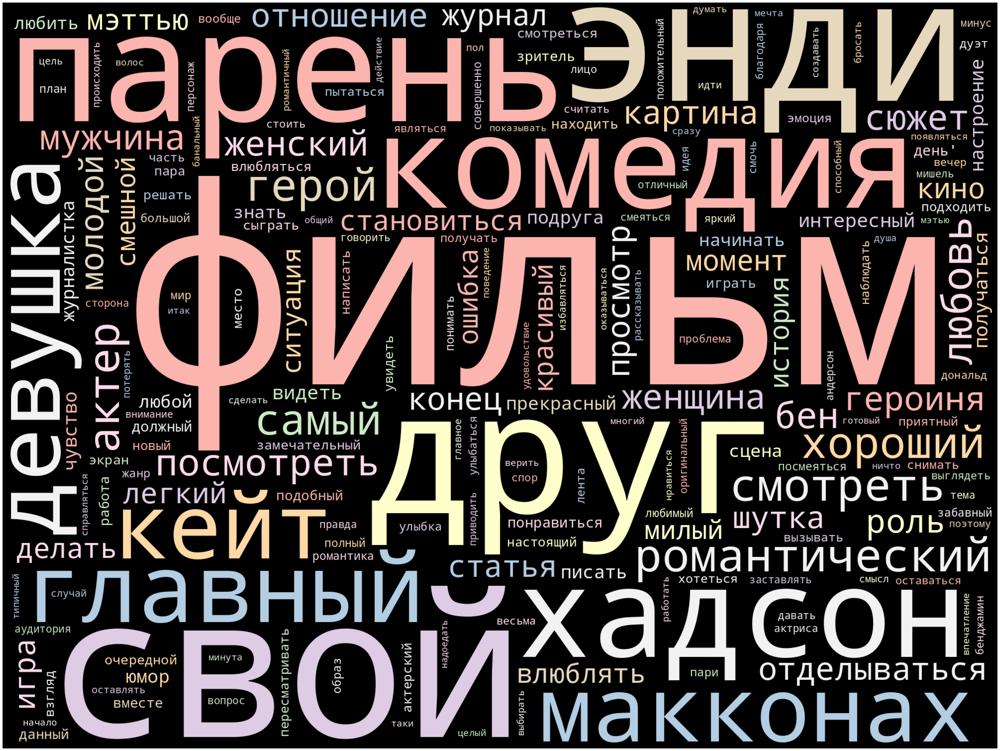

In [62]:
# Генерируем облако слов
wordcloud = WordCloud(width = 2000,
                      height = 1500,
                      random_state=1,
                      background_color='black',
                      margin=20,
                      colormap='Pastel1',
                      collocations=False,
                      stopwords = STOPWORDS_RU).generate(lem11)

# Рисуем картинку
plot_cloud(wordcloud)

In [58]:
wordcloud.to_file('10dney_kinopoisk1.png')

# Токенизация и частотность

In [ ]:
#https://habr.com/ru/articles/800595/
#https://habr.com/ru/articles/517410/
#https://pythonspot.com/nltk-stop-words/

In [63]:
len(lem11)

113057

In [65]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')
tokens = tokenizer.tokenize(lem11)
print(tokens)

['это', 'добрый', 'легкий', 'искренний', 'романтический', 'комедия', 'который', 'сделать', 'ваш', 'настроение', 'хороший', 'и', 'скрасить', 'вечер', 'или', 'выходной', 'я', 'смотреть', 'много', 'раз', 'и', 'я', 'не', 'надоедать', 'готовый', 'включать', 'и', 'сейчас', 'сюжет', 'настолько', 'жизненный', 'но', 'вместе', 'с', 'то', 'ситуация', 'утрировать', 'на', 'максимум', 'что', 'смех', 'вызывать', 'каждый', 'сцена', 'кейт', 'хадсон', 'энди', 'и', 'мэтью', 'макконах', 'бен', 'талантливый', 'актер', 'фильм', 'с', 'их', 'участие', 'всегда', 'радовать', 'актер', 'выглядеть', 'в', 'кадр', 'естественно', 'энди', 'такой', 'задорный', 'милый', 'лучезарный', 'невозможно', 'не', 'улыбаться', 'смотреть', 'на', 'она', 'бен', 'красивый', 'харизматичный', 'с', 'шикарный', 'улыбка', 'и', 'хитрый', 'взгляд', 'ну', 'как', 'не', 'влюбляться', 'весь', 'ситуация', 'который', 'создавать', 'энди', 'и', 'реакция', 'бен', 'на', 'они', 'очень', 'смешной', 'вместе', 'актер', 'насколько', 'гармонично', 'смотреть

In [66]:
len(tokens)

17266

In [67]:
#Для подсчёта статистики распределения частот слов в тексте применяется класс FreqDist (frequency distributions):

from nltk.probability import FreqDist
fdist = FreqDist(tokens)

In [69]:
fdist.most_common(20)

[('и', 719),
 ('в', 479),
 ('не', 377),
 ('что', 320),
 ('фильм', 263),
 ('на', 239),
 ('то', 183),
 ('как', 168),
 ('с', 165),
 ('он', 162),
 ('быть', 161),
 ('я', 160),
 ('этот', 152),
 ('это', 142),
 ('а', 136),
 ('но', 134),
 ('она', 134),
 ('10', 132),
 ('который', 126),
 ('свой', 117)]

<Axes: xlabel='Samples', ylabel='Counts'>

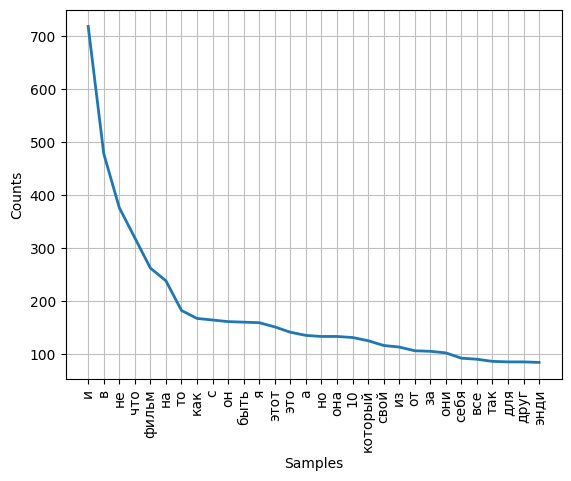

In [70]:
fdist.plot(30,cumulative=False)

Убираем лишние слова:

In [ ]:
#from nltk.corpus import stopwords
#rfrom nltk.tokenize import sent_tokenize, word_tokenize

#data = "All work and no play makes jack dull boy. All work and no play makes jack a dull boy."
#stopWords = set(stopwords.words('english'))
#words = word_tokenize(data)
#wordsFiltered = [w for w in words if w not in stopWords]

#print(wordsFiltered)

In [74]:
from nltk.corpus import stopwords
#STOPWORDS_RU = get_stop_words('russian')
#russian_stopwords = set(stopwords.words('russian'))

clean_tkns = [w for w in tokens if w not in STOPWORDS_RU]

print(clean_tkns)

['добрый', 'легкий', 'искренний', 'романтический', 'комедия', 'сделать', 'настроение', 'хороший', 'скрасить', 'вечер', 'выходной', 'смотреть', 'надоедать', 'готовый', 'включать', 'сюжет', 'настолько', 'жизненный', 'вместе', 'ситуация', 'утрировать', 'максимум', 'смех', 'вызывать', 'сцена', 'кейт', 'хадсон', 'энди', 'мэтью', 'макконах', 'бен', 'талантливый', 'актер', 'фильм', 'участие', 'радовать', 'актер', 'выглядеть', 'кадр', 'естественно', 'энди', 'задорный', 'милый', 'лучезарный', 'невозможно', 'улыбаться', 'смотреть', 'бен', 'красивый', 'харизматичный', 'шикарный', 'улыбка', 'хитрый', 'взгляд', 'влюбляться', 'ситуация', 'создавать', 'энди', 'реакция', 'бен', 'смешной', 'вместе', 'актер', 'насколько', 'гармонично', 'смотреться', 'казаться', 'реальный', 'чувство', 'сыграть', 'естественный', 'влюбленный', 'взгляд', 'актер', 'идея', 'фильм', 'интересный', 'смотреть', 'настоящий', 'удовольствие', 'работать', 'влюбляться', 'молодой', 'делать', 'отталкивать', 'фильм', 'выходить', 'душевны

In [123]:
FreqDist(clean_tkns).most_common(30)

[('фильм', 263),
 ('10', 132),
 ('свой', 117),
 ('друг', 86),
 ('энди', 85),
 ('парень', 76),
 ('комедия', 70),
 ('хадсон', 65),
 ('главный', 65),
 ('кейт', 58),
 ('макконах', 58),
 ('девушка', 58),
 ('романтический', 56),
 ('смотреть', 54),
 ('герой', 53),
 ('хороший', 52),
 ('актер', 52),
 ('любовь', 49),
 ('самый', 48),
 ('посмотреть', 45),
 ('бен', 41),
 ('сюжет', 39),
 ('мужчина', 39),
 ('женский', 38),
 ('женщина', 38),
 ('героиня', 37),
 ('отношение', 36),
 ('роль', 35),
 ('молодой', 34),
 ('отделываться', 34)]

<Axes: xlabel='Samples', ylabel='Counts'>

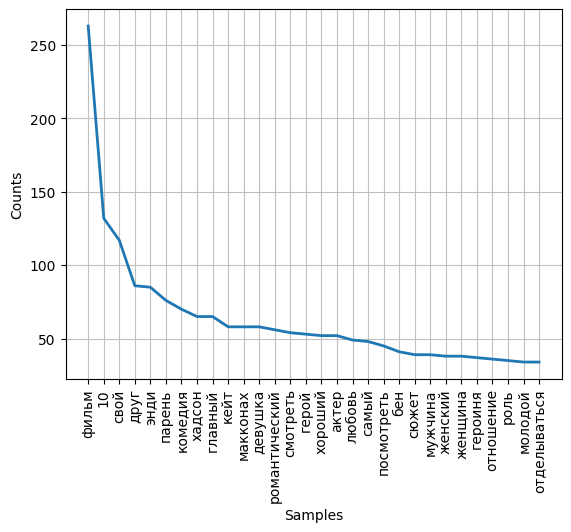

In [81]:
FreqDist(clean_tkns).plot(30,cumulative=False)

In [79]:
#Вы можете добавить свои стоп-слова в переменнуюSTOPWORDS_RU с помощью метода .add (‘новое стоп-слово’)
#print(STOPWORDS_RU)
#STOPWORDS_RU.add('свой')

# **Шаг 2**: Кинопоиск, "Чего хотят женщины"

In [ ]:
# инициализируем html-код страницы
url2 = 'https://www.kinopoisk.ru/film/880/reviews/?ord=date&rnd=1741154928&perpage=75'
page = requests.get(url2)
print(page.status_code)

200


In [ ]:
soup = BeautifulSoup(page.text, "html.parser")
print(soup) #Нам вылезет весь html-код нашей страницы


<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "http://www.w3.org/TR/xhtml1/DTD/xhtml1-transitional.dtd">

<html dir="ltr" lang="ru" prefix="og: http://ogp.me/ns# video: http://ogp.me/ns/video# ya: http://webmaster.yandex.ru/vocabularies/" xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/">
<head profile="http://gmpg.org/xfn/11">
<title>Чего хотят женщины (2000) — отзывы и рецензии — Кинопоиск</title>
<meta content="text/html; charset=utf-8" http-equiv="content-type"/>
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<meta content="121953784483000" property="fb:app_id"/>
<meta content="Кинопоиск" name="application-name"/>
<meta content="width=960" name="viewport">
<meta content="152308956519" property="fb:pages"/>
<link href="/kp_search.xml" rel="search" title="Поиск на kinopoisk.ru" type="application/opensearchdescription+xml"/>
<meta content="#000" name="msapplication-TileColor"/>
<meta content="https://yastatic.net/s3

In [ ]:
#Теперь создадим два списка для текстов
filteredText2 = []
allText2 = []

allText2 = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')

for data in allText2:
    if data.findAll('span', class_='_reachbanner_', itemprop='reviewBody') is not None:
        filteredText2.append(data.text)

for data in filteredText2:
    print(data)

Романтическая комедия про эгоистичного пошляка, который каким-то непонятным образом получил возможность читать мысли женщин. Фильм не без достоинств, но всё же большое на любителя. Ладно, обо всём по порядку. 

Начнём с главного героя. Ник Маршалл - так его зовут - занимает одну из руководящих должностей в компании, рекламирующей товары для женщин. С самого начала он мне не понравился, и значительную часть фильма он казался мне просто отталкивающим. Пошлый юмор героя, постельные сцены и вообще зацикленность на сексе мало кому нравятся, более того - от этого тошнит.

Герой поначалу - бесчувственный эгоист, пошлый и некультурный. Но начав читать чужие мысли, он понимает, что себя слишком переоценил. И он задумывается о своём отношении к окружающим (конечно же, женщинам; в фильме вообще мужчин почти нет - видно, кто снимал) - вспоминает, что есть сотрудники по работе, есть семья и т.д. Главный герой влюбляется, и, конечно же, в конце концов становится человеком. Финал, естественно, очень 

<ipython-input-120-e84a7c72137f>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allText = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')
<ipython-input-120-e84a7c72137f>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if data.findAll('span', class_='_reachbanner_', itemprop='reviewBody') is not None:


In [ ]:
print(filteredText2[0])

Романтическая комедия про эгоистичного пошляка, который каким-то непонятным образом получил возможность читать мысли женщин. Фильм не без достоинств, но всё же большое на любителя. Ладно, обо всём по порядку. 

Начнём с главного героя. Ник Маршалл - так его зовут - занимает одну из руководящих должностей в компании, рекламирующей товары для женщин. С самого начала он мне не понравился, и значительную часть фильма он казался мне просто отталкивающим. Пошлый юмор героя, постельные сцены и вообще зацикленность на сексе мало кому нравятся, более того - от этого тошнит.

Герой поначалу - бесчувственный эгоист, пошлый и некультурный. Но начав читать чужие мысли, он понимает, что себя слишком переоценил. И он задумывается о своём отношении к окружающим (конечно же, женщинам; в фильме вообще мужчин почти нет - видно, кто снимал) - вспоминает, что есть сотрудники по работе, есть семья и т.д. Главный герой влюбляется, и, конечно же, в конце концов становится человеком. Финал, естественно, очень 

In [ ]:
#Даты
allCalendar2 = []
filteredCalendar2 = []

allCalendar2 = soup.findAll('span', class_='date')

for dataCalendar in allCalendar2:
    if dataCalendar.findAll('span', class_='date') is not None:
        filteredCalendar2.append(dataCalendar.text)

<ipython-input-122-2589bb70e453>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allCalendar = soup.findAll('span', class_='date')
<ipython-input-122-2589bb70e453>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataCalendar.findAll('span', class_='date') is not None:


In [ ]:
print(filteredCalendar2[0])

14 августа 2023 | 13:10


In [ ]:
#Заголовки
allTitle2 = []
filteredTitle2 = []

allTitle2 = soup.findAll('p', class_='sub_title')

for dataTitle in allTitle2:
    if dataTitle.findAll('p', class_='sub_title') is not None:
        filteredTitle2.append(dataTitle.text)

<ipython-input-124-1bb7ddb1e9cd>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allTitle = soup.findAll('p', class_='sub_title')
<ipython-input-124-1bb7ddb1e9cd>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataTitle.findAll('p', class_='sub_title') is not None:


In [ ]:
print(filteredTitle2[0])

- Скажи, что ты голубой, и я отстану! - Да, голубой. - Насколько? - Голубее не бывает.


In [ ]:
print(len(filteredText2))
print(len(filteredTitle2))
print(len(filteredCalendar2))

66
66
66


In [ ]:
dict2 = {'calendar': filteredCalendar2, 'title': filteredTitle2, 'text': filteredText2}

df2 = pd.DataFrame(dict2)

print(df2)

                    calendar  \
0    14 августа 2023 | 13:10   
1    31 декабря 2022 | 15:19   
2        12 мая 2022 | 00:59   
3    04 февраля 2022 | 13:35   
4    25 декабря 2021 | 15:44   
..                       ...   
61  09 сентября 2008 | 17:40   
62      31 июля 2008 | 19:27   
63     28 марта 2008 | 10:39   
64      09 июня 2007 | 00:13   
65    21 ноября 2006 | 22:42   

                                                title  \
0   - Скажи, что ты голубой, и я отстану! - Да, го...   
1                                                       
2                        Очень эмпатичный плэйбой Мэл   
3                           Лучший фильм для свидания   
4                         Никаких игр. Только любовь.   
..                                                ...   
61        Женщинам нужен Мэл. Мэла всем не хватает...   
62                                 Женщины о мужчинах   
63                      Это под силу каждому мужчине!   
64                                           

In [ ]:
#df2.to_csv('womenwant_kinopoisk.csv', index=False)

# Лемматизация и облако слов

In [ ]:
#https://skillbox.ru/media/code/kak-preobrazovat-spisok-v-stroku-v-python/
#https://sky.pro/media/poluchenie-spiska-iz-stolbcza-ili-stroki-dataframe-v-pandas/#:~:text=%D0%9C%D0%B5%D1%82%D0%BE%D0%B4%20tolist()%20%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D1%83%D0%B5%D1%82%20%D1%81%D1%82%D0%BE%D0%BB%D0%B1%D0%B5%D1%86,%D0%BF%D0%B5%D1%80%D0%B5%D0%BC%D0%B5%D0%BD%D0%BD%D0%B0%D1%8F%20list_of_goods%20%D1%81%D0%BE%D0%B4%D0%B5%D1%80%D0%B6%D0%B8%D1%82%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA%20%D1%82%D0%BE%D0%B2%D0%B0%D1%80%D0%BE%D0%B2.&text=%D0%A2%D0%B0%D0%BA%D0%B8%D0%BC%20%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%BC%2C%20%D1%81%20%D0%BF%D0%BE%D0%BC%D0%BE%D1%89%D1%8C%D1%8E%20%D0%BC%D0%B5%D1%82%D0%BE%D0%B4%D0%B0,%D0%B8%D0%BB%D0%B8%20%D1%81%D1%82%D1%80%D0%BE%D0%BA%D0%B8%20DataFrame%20%D0%B2%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA.
#https://github.com/nlpub/pymystem3
#https://habr.com/ru/articles/446530/
#https://skillbox.ru/media/code/vizualiziruy-eto-oblako-slov-na-python/

Добавляем наш csv-файл:

In [ ]:
#import pandas as pd

In [82]:
film12 = pd.read_csv('/womenwant_kinopoisk.csv')
print(film12)

                    calendar  \
0    14 августа 2023 | 13:10   
1    31 декабря 2022 | 15:19   
2        12 мая 2022 | 00:59   
3    04 февраля 2022 | 13:35   
4    25 декабря 2021 | 15:44   
..                       ...   
61  09 сентября 2008 | 17:40   
62      31 июля 2008 | 19:27   
63     28 марта 2008 | 10:39   
64      09 июня 2007 | 00:13   
65    21 ноября 2006 | 22:42   

                                                title  \
0   - Скажи, что ты голубой, и я отстану! - Да, го...   
1                                                 NaN   
2                        Очень эмпатичный плэйбой Мэл   
3                           Лучший фильм для свидания   
4                         Никаких игр. Только любовь.   
..                                                ...   
61        Женщинам нужен Мэл. Мэла всем не хватает...   
62                                 Женщины о мужчинах   
63                      Это под силу каждому мужчине!   
64                                           

In [83]:
print(film12['text'])

0     Романтическая комедия про эгоистичного пошляка...
1     Досматривая фильм не знаю в какой раз, подумал...
2     С этим фильмом у меня связана необычная истори...
3     Забавный парадокс - этот фильм единственная ка...
4     Нэнси Майерс - талантливый режиссер с рядом пр...
                            ...                        
61    Сейчас я Вам всё объясню популярно…\n\r\nЕсли ...
62    А вам хотелось понять женщин? Мне да, столько ...
63    Я люблю этот фильм, он не утомляет. Сюжет не т...
64    Это лучший фильм в своём жанре!\n\r\nОчень про...
65    На мой взгляд, 'Чего хотят женщины' - один из ...
Name: text, Length: 66, dtype: object


Делаем лемматизацию:

In [84]:
lst = film12['text'].tolist()
text12 = ''
for el in lst:
    #Добавляем к строке элемент списка
    text12 += str(el)
    #Добавляем к строке разделитель — в данном случае пробел
    text12 += ' '
print(text12)

Романтическая комедия про эгоистичного пошляка, который каким-то непонятным образом получил возможность читать мысли женщин. Фильм не без достоинств, но всё же большое на любителя. Ладно, обо всём по порядку. 

Начнём с главного героя. Ник Маршалл - так его зовут - занимает одну из руководящих должностей в компании, рекламирующей товары для женщин. С самого начала он мне не понравился, и значительную часть фильма он казался мне просто отталкивающим. Пошлый юмор героя, постельные сцены и вообще зацикленность на сексе мало кому нравятся, более того - от этого тошнит.

Герой поначалу - бесчувственный эгоист, пошлый и некультурный. Но начав читать чужие мысли, он понимает, что себя слишком переоценил. И он задумывается о своём отношении к окружающим (конечно же, женщинам; в фильме вообще мужчин почти нет - видно, кто снимал) - вспоминает, что есть сотрудники по работе, есть семья и т.д. Главный герой влюбляется, и, конечно же, в конце концов становится человеком. Финал, естественно, очень 

In [ ]:
#!pip install pymorphy2
!pip install pymystem3

In [85]:
from pymystem3 import Mystem
m = Mystem()

lemmas = m.lemmatize(text12)
lem12 = ''.join(lemmas).strip()
print(lem12)

романтический комедия про эгоистичный пошляк, который какой-то непонятный образ получать возможность читать мысль женщина. фильм не без достоинство, но все же большой на любитель. ладно, обо все по порядок. 

начинать с главный герой. ник маршалл - так он звать - занимать один из руководящий должность в компания, рекламировать товар для женщина. с самый начало он я не понравиться, и значительный часть фильм он казаться я просто отталкивающий. пошлый юмор герой, постельный сцена и вообще зацикленность на секс мало кто нравиться, более то - от это тошнить.

герой поначалу - бесчувственный эгоист, пошлый и некультурный. но начинать читать чужой мысль, он понимать, что себя слишком переоценивать. и он задумываться о свой отношение к окружающие (конечно же, женщина; в фильм вообще мужчина почти нет - видно, кто снимать) - вспоминать, что быть сотрудник по работа, быть семья и т.д. главный герой влюбляться, и, конечно же, в конец конец становиться человек. финал, естественно, очень слащавый,

Делаем Word2vec (Облако слов)

In [ ]:
!pip install stop-words

  Preparing metadata (setup.py) ... done
  Created wheel for stop-words: filename=stop_words-2018.7.23-py3-none-any.whl size=32894 sha256=bd0bf4a12d0ee04daa4ee0eee13f905405bf837089b8f6f673e7c697b243d2a7
  Stored in directory: /root/.cache/pip/wheels/8f/a5/51/a5405e1da5d178491b79d12cc81b6cb9bb14fe2c8c632eba70
Successfully built stop-words


In [86]:
# Очищаем текст с помощью регулярных выражений
import re
lem12 = re.sub(r'==.*?==+', '', lem12) # удаляем лишние символы
lem12 = lem12.replace('\n', '') # удаляем знаки разделения на абзацы

In [87]:
# Импортируем библиотеку для визуализации
import matplotlib.pyplot as plt
%matplotlib inline

# Функция для визуализации облака слов
def plot_cloud(wordcloud):
    # Устанавливаем размер картинки
    plt.figure(figsize=(50, 50))
    # Показать изображение
    plt.imshow(wordcloud)
    # Без подписей на осях
    plt.axis("off")

In [88]:
# Импортируем инструменты для облака слов и списки стоп-слов
from wordcloud import WordCloud
from stop_words import get_stop_words

# Записываем в переменную стоп-слова русского языка
STOPWORDS_RU = get_stop_words('russian')

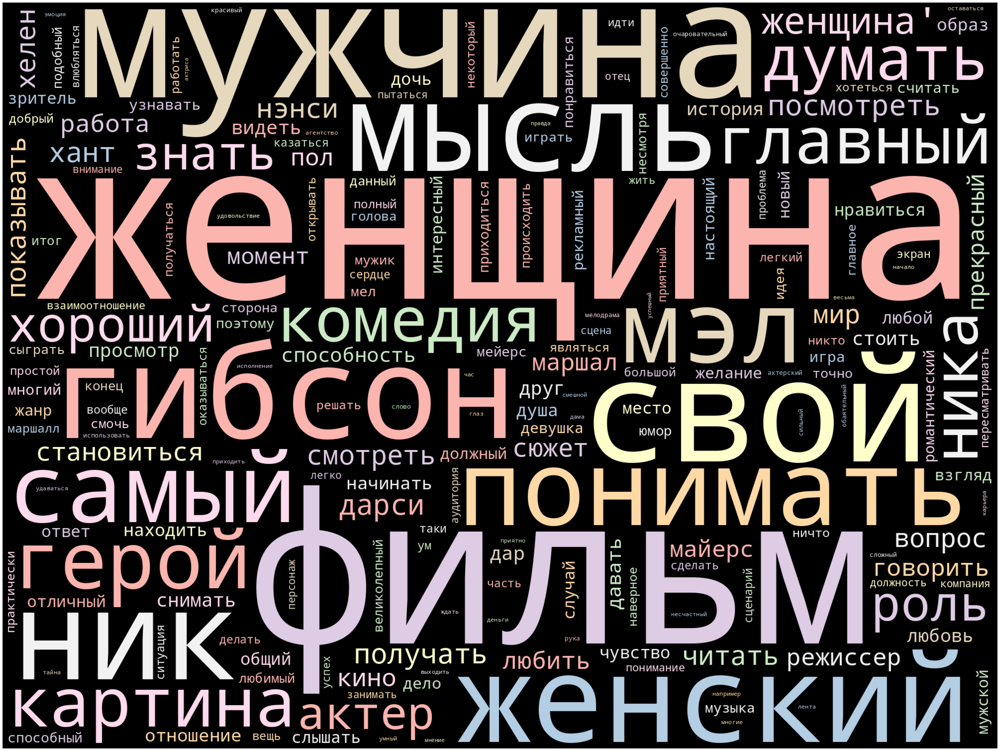

In [89]:
# Генерируем облако слов
wordcloud = WordCloud(width = 2000,
                      height = 1500,
                      random_state=1,
                      background_color='black',
                      margin=20,
                      colormap='Pastel1',
                      collocations=False,
                      stopwords = STOPWORDS_RU).generate(lem12)

# Рисуем картинку
plot_cloud(wordcloud)

In [90]:
wordcloud.to_file('womenwant_kinopoisk1.png')

# Токенизация и частотность

In [91]:
#https://habr.com/ru/articles/800595/
#https://habr.com/ru/articles/517410/

In [92]:
len(lem12)

149212

In [93]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')
tokens2 = tokenizer.tokenize(lem12)
print(tokens2)

['романтический', 'комедия', 'про', 'эгоистичный', 'пошляк', 'который', 'какой', 'то', 'непонятный', 'образ', 'получать', 'возможность', 'читать', 'мысль', 'женщина', 'фильм', 'не', 'без', 'достоинство', 'но', 'все', 'же', 'большой', 'на', 'любитель', 'ладно', 'обо', 'все', 'по', 'порядок', 'начинать', 'с', 'главный', 'герой', 'ник', 'маршалл', 'так', 'он', 'звать', 'занимать', 'один', 'из', 'руководящий', 'должность', 'в', 'компания', 'рекламировать', 'товар', 'для', 'женщина', 'с', 'самый', 'начало', 'он', 'я', 'не', 'понравиться', 'и', 'значительный', 'часть', 'фильм', 'он', 'казаться', 'я', 'просто', 'отталкивающий', 'пошлый', 'юмор', 'герой', 'постельный', 'сцена', 'и', 'вообще', 'зацикленность', 'на', 'секс', 'мало', 'кто', 'нравиться', 'более', 'то', 'от', 'это', 'тошнить', 'герой', 'поначалу', 'бесчувственный', 'эгоист', 'пошлый', 'и', 'некультурный', 'но', 'начинать', 'читать', 'чужой', 'мысль', 'он', 'понимать', 'что', 'себя', 'слишком', 'переоценивать', 'и', 'он', 'задумыват

In [94]:
len(tokens2)

22700

Убираем лишние слова:

In [95]:
from nltk.corpus import stopwords
#STOPWORDS_RU = get_stop_words('russian')
#russian_stopwords = set(stopwords.words('russian'))

clean_tkns2 = [w for w in tokens2 if w not in STOPWORDS_RU]
print(clean_tkns2)

['романтический', 'комедия', 'эгоистичный', 'пошляк', 'непонятный', 'образ', 'получать', 'возможность', 'читать', 'мысль', 'женщина', 'фильм', 'достоинство', 'большой', 'любитель', 'ладно', 'обо', 'порядок', 'начинать', 'главный', 'герой', 'ник', 'маршалл', 'звать', 'занимать', 'руководящий', 'должность', 'компания', 'рекламировать', 'товар', 'женщина', 'самый', 'начало', 'понравиться', 'значительный', 'часть', 'фильм', 'казаться', 'отталкивающий', 'пошлый', 'юмор', 'герой', 'постельный', 'сцена', 'вообще', 'зацикленность', 'секс', 'нравиться', 'тошнить', 'герой', 'поначалу', 'бесчувственный', 'эгоист', 'пошлый', 'некультурный', 'начинать', 'читать', 'чужой', 'мысль', 'понимать', 'переоценивать', 'задумываться', 'свой', 'отношение', 'окружающие', 'женщина', 'фильм', 'вообще', 'мужчина', 'видно', 'снимать', 'вспоминать', 'сотрудник', 'работа', 'семья', 'д', 'главный', 'герой', 'влюбляться', 'конец', 'конец', 'становиться', 'финал', 'естественно', 'слащавый', 'целое', 'приятный', 'забыва

In [96]:
#Для подсчёта статистики распределения частот слов в тексте применяется класс FreqDist (frequency distributions):

from nltk.probability import FreqDist
fdist = FreqDist(clean_tkns2)

In [124]:
FreqDist(clean_tkns2).most_common(30)

[('женщина', 423),
 ('фильм', 320),
 ('мужчина', 185),
 ('свой', 140),
 ('гибсон', 111),
 ('мысль', 102),
 ('ник', 102),
 ('женский', 102),
 ('понимать', 87),
 ('мэл', 80),
 ('самый', 79),
 ('герой', 78),
 ('10', 72),
 ('картина', 67),
 ('главный', 66),
 ('ника', 61),
 ('комедия', 60),
 ('думать', 59),
 ('хороший', 57),
 ('роль', 56),
 ('знать', 54),
 ('актер', 49),
 ('посмотреть', 46),
 ('дарси', 45),
 ('получать', 44),
 ('хант', 44),
 ('нэнси', 43),
 ('читать', 42),
 ('смотреть', 42),
 ('показывать', 42)]

<Axes: xlabel='Samples', ylabel='Counts'>

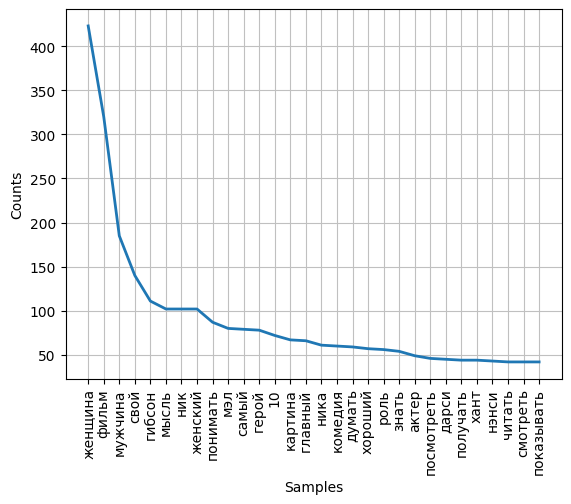

In [98]:
FreqDist(clean_tkns2).plot(30,cumulative=False)

In [99]:
#Вы можете добавить свои стоп-слова в переменнуюSTOPWORDS_RU с помощью метода .add (‘новое стоп-слово’)
#print(STOPWORDS_RU)
#STOPWORDS_RU.add('свой')

# **Шаг 3**: Кинопоиск, "Дневник Бриджет Джонс"

In [ ]:
# инициализируем html-код страницы
url3 = 'https://www.kinopoisk.ru/film/621/reviews/ord/rating/status/all/perpage/200/'
page = requests.get(url3)
print(page.status_code)

200


In [ ]:
soup = BeautifulSoup(page.text, "html.parser")
print(soup) #Нам вылезет весь html-код нашей страницы


<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "http://www.w3.org/TR/xhtml1/DTD/xhtml1-transitional.dtd">

<html dir="ltr" lang="ru" prefix="og: http://ogp.me/ns# video: http://ogp.me/ns/video# ya: http://webmaster.yandex.ru/vocabularies/" xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/">
<head profile="http://gmpg.org/xfn/11">
<title>Дневник Бриджит Джонс (2001) — отзывы и рецензии — Кинопоиск</title>
<meta content="text/html; charset=utf-8" http-equiv="content-type"/>
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<meta content="121953784483000" property="fb:app_id"/>
<meta content="Кинопоиск" name="application-name"/>
<meta content="width=960" name="viewport">
<meta content="152308956519" property="fb:pages"/>
<link href="/kp_search.xml" rel="search" title="Поиск на kinopoisk.ru" type="application/opensearchdescription+xml"/>
<meta content="#000" name="msapplication-TileColor"/>
<meta content="https://yastatic.net

In [ ]:
#Теперь создадим два списка для текстов
filteredText3 = []
allText3 = []

allText3 = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')

for data in allText3:
    if data.findAll('span', class_='_reachbanner_', itemprop='reviewBody') is not None:
        filteredText3.append(data.text)

for data in filteredText3:
    print(data)

«Дневник Бриджет Джонс» я впервые посмотрела в далеком 2002, было мне тогда 17 лет. Помню, фильм показался мне замечательной романтической сказкой, в основном благодаря персонажу Колина Ферта, Марку Дарси, в которого я, как и полагается, влюбилась. 

Пересмотрев фильм недавно за компанию с подругой, я оценила его более взрослым взглядом, хотя некоторые впечатления почти не изменились. Это в основном касается главных героев. А вот история, до этого оставившая почти равнодушной, теперь скорее привела в недоумение. 

Я не понимаю, за что все так любят Бриджет Джонс. Не понимаю ее феномен. Ах да, она ведь такая несовершенная, прямо как все мы. Да, никто из нас не совершенен. Но это не оправдывает откровенно глупое поведение Бриджет в некоторых сценах. Не спорю, казусы случаются с каждым из нас, часто это не зависит от наших умственных способностей, но постоянно нести всякий вздор на людях – это не милое и непосредственное выражение индивидуальности, это натуральное проявление глупости. 

П

<ipython-input-131-e84a7c72137f>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allText = soup.findAll('span', class_='_reachbanner_', itemprop='reviewBody')
<ipython-input-131-e84a7c72137f>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if data.findAll('span', class_='_reachbanner_', itemprop='reviewBody') is not None:


In [ ]:
print(filteredText3[0])

«Дневник Бриджет Джонс» я впервые посмотрела в далеком 2002, было мне тогда 17 лет. Помню, фильм показался мне замечательной романтической сказкой, в основном благодаря персонажу Колина Ферта, Марку Дарси, в которого я, как и полагается, влюбилась. 

Пересмотрев фильм недавно за компанию с подругой, я оценила его более взрослым взглядом, хотя некоторые впечатления почти не изменились. Это в основном касается главных героев. А вот история, до этого оставившая почти равнодушной, теперь скорее привела в недоумение. 

Я не понимаю, за что все так любят Бриджет Джонс. Не понимаю ее феномен. Ах да, она ведь такая несовершенная, прямо как все мы. Да, никто из нас не совершенен. Но это не оправдывает откровенно глупое поведение Бриджет в некоторых сценах. Не спорю, казусы случаются с каждым из нас, часто это не зависит от наших умственных способностей, но постоянно нести всякий вздор на людях – это не милое и непосредственное выражение индивидуальности, это натуральное проявление глупости. 

П

In [ ]:
#Даты
allCalendar3 = []
filteredCalendar3 = []

allCalendar3 = soup.findAll('span', class_='date')

for dataCalendar in allCalendar3:
    if dataCalendar.findAll('span', class_='date') is not None:
        filteredCalendar3.append(dataCalendar.text)

<ipython-input-133-2589bb70e453>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allCalendar = soup.findAll('span', class_='date')
<ipython-input-133-2589bb70e453>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataCalendar.findAll('span', class_='date') is not None:


In [ ]:
print(filteredCalendar3[0])

13 марта 2010 | 22:15


In [ ]:
#Заголовки
allTitle3 = []
filteredTitle3 = []

allTitle3 = soup.findAll('p', class_='sub_title')

for dataTitle in allTitle3:
    if dataTitle.findAll('p', class_='sub_title') is not None:
        filteredTitle3.append(dataTitle.text)

<ipython-input-135-1bb7ddb1e9cd>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allTitle = soup.findAll('p', class_='sub_title')
<ipython-input-135-1bb7ddb1e9cd>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataTitle.findAll('p', class_='sub_title') is not None:


In [ ]:
print(filteredTitle3[0])

In [ ]:
print(len(filteredText3))
print(len(filteredTitle3))
print(len(filteredCalendar3))

156
156
156


In [ ]:
dict3 = {'calendar': filteredCalendar3, 'title': filteredTitle3, 'text': filteredText3}

df3 = pd.DataFrame(dict3)

print(df3)

                    calendar  \
0      13 марта 2010 | 22:15   
1     29 ноября 2007 | 21:42   
2    16 февраля 2023 | 22:06   
3      29 марта 2009 | 22:40   
4    29 августа 2015 | 20:39   
..                       ...   
151   18 апреля 2010 | 23:58   
152      06 мая 2009 | 23:37   
153   29 января 2007 | 11:23   
154   12 января 2010 | 12:25   
155   08 ноября 2011 | 02:38   

                                                 title  \
0                                                        
1                                  Само Несовершенство   
2                     Почему мне нравится эта глупость   
3                                                        
4                                            Неправда!   
..                                                 ...   
151                                        Книга лучше   
152  Бриджит? Или сборник аллюзий с 'Гордостью и пр...   
153                                                      
154         Бриджит Джонс или истор

In [ ]:
#df3.to_csv('bridget_kinopoisk.csv', index=False)

# Лемматизация и облако слов

In [ ]:
#https://skillbox.ru/media/code/kak-preobrazovat-spisok-v-stroku-v-python/
#https://sky.pro/media/poluchenie-spiska-iz-stolbcza-ili-stroki-dataframe-v-pandas/#:~:text=%D0%9C%D0%B5%D1%82%D0%BE%D0%B4%20tolist()%20%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D1%83%D0%B5%D1%82%20%D1%81%D1%82%D0%BE%D0%BB%D0%B1%D0%B5%D1%86,%D0%BF%D0%B5%D1%80%D0%B5%D0%BC%D0%B5%D0%BD%D0%BD%D0%B0%D1%8F%20list_of_goods%20%D1%81%D0%BE%D0%B4%D0%B5%D1%80%D0%B6%D0%B8%D1%82%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA%20%D1%82%D0%BE%D0%B2%D0%B0%D1%80%D0%BE%D0%B2.&text=%D0%A2%D0%B0%D0%BA%D0%B8%D0%BC%20%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%BC%2C%20%D1%81%20%D0%BF%D0%BE%D0%BC%D0%BE%D1%89%D1%8C%D1%8E%20%D0%BC%D0%B5%D1%82%D0%BE%D0%B4%D0%B0,%D0%B8%D0%BB%D0%B8%20%D1%81%D1%82%D1%80%D0%BE%D0%BA%D0%B8%20DataFrame%20%D0%B2%20%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA.
#https://github.com/nlpub/pymystem3
#https://habr.com/ru/articles/446530/
#https://skillbox.ru/media/code/vizualiziruy-eto-oblako-slov-na-python/

Добавляем наш csv-файл:

In [ ]:
#import pandas as pd

In [100]:
film13 = pd.read_csv('/bridget_kinopoisk.csv')
print(film13)

                    calendar  \
0      13 марта 2010 | 22:15   
1     29 ноября 2007 | 21:42   
2    16 февраля 2023 | 22:06   
3      29 марта 2009 | 22:40   
4    29 августа 2015 | 20:39   
..                       ...   
151   18 апреля 2010 | 23:58   
152      06 мая 2009 | 23:37   
153   29 января 2007 | 11:23   
154   12 января 2010 | 12:25   
155   08 ноября 2011 | 02:38   

                                                 title  \
0                                                  NaN   
1                                  Само Несовершенство   
2                     Почему мне нравится эта глупость   
3                                                  NaN   
4                                            Неправда!   
..                                                 ...   
151                                        Книга лучше   
152  Бриджит? Или сборник аллюзий с 'Гордостью и пр...   
153                                                NaN   
154         Бриджит Джонс или истор

In [101]:
print(film13['text'])

0      «Дневник Бриджет Джонс» я впервые посмотрела в...
1      Я думаю, что писать о достоинствах фильма можн...
2      Вообще, в 2023 писать рецензию на этот фильм с...
3      Пусть лучше надо мной смеются, чем плачут обо ...
4      Честно говоря, мне история «Бриджит Джонс» нра...
                             ...                        
151    Фильм очень сильно разочаровал. Насколько инте...
152    Дневник Бриджит Джонс…Не люблю такие фильмы. Н...
153    Наконец-то, я посмотрела этот фильм и была раз...
154    Поздним вечером, медленно погружаясь в сон, я ...
155    После детального ознакомления с этим фильмом, ...
Name: text, Length: 156, dtype: object


Делаем лемматизацию:

In [102]:
lst = film13['text'].tolist()
text13 = ''
for el in lst:
    #Добавляем к строке элемент списка
    text13 += str(el)
    #Добавляем к строке разделитель — в данном случае пробел
    text13 += ' '
print(text13)

«Дневник Бриджет Джонс» я впервые посмотрела в далеком 2002, было мне тогда 17 лет. Помню, фильм показался мне замечательной романтической сказкой, в основном благодаря персонажу Колина Ферта, Марку Дарси, в которого я, как и полагается, влюбилась. 

Пересмотрев фильм недавно за компанию с подругой, я оценила его более взрослым взглядом, хотя некоторые впечатления почти не изменились. Это в основном касается главных героев. А вот история, до этого оставившая почти равнодушной, теперь скорее привела в недоумение. 

Я не понимаю, за что все так любят Бриджет Джонс. Не понимаю ее феномен. Ах да, она ведь такая несовершенная, прямо как все мы. Да, никто из нас не совершенен. Но это не оправдывает откровенно глупое поведение Бриджет в некоторых сценах. Не спорю, казусы случаются с каждым из нас, часто это не зависит от наших умственных способностей, но постоянно нести всякий вздор на людях – это не милое и непосредственное выражение индивидуальности, это натуральное проявление глупости. 

П

In [ ]:
#!pip install pymorphy2
!pip install pymystem3

In [109]:
from pymystem3 import Mystem
m = Mystem()

lemmas = m.lemmatize(text13)
lem13 = ''.join(lemmas).strip()
print(lem13)

«дневник бриджет джонс» я впервые посмотреть в далекий 2002, быть я тогда 17 год. помнить, фильм показываться я замечательный романтический сказка, в основное благодаря персонаж колин ферт, марка дарси, в который я, как и полагаться, влюбляться. 

пересматривать фильм недавно за компания с подруга, я оценивать он более взрослый взгляд, хотя некоторый впечатление почти не изменяться. это в основной касаться главный герой. а вот история, до это оставлять почти равнодушный, теперь скоро приводить в недоумение. 

я не понимать, за что все так любить бриджет джонс. не понимать она феномен. ах да, она ведь такой несовершенный, прямо как весь мы. да, никто из мы не совершенный. но это не оправдывать откровенно глупый поведение бриджет в некоторый сцена. не спорить, казус случаться с каждый из мы, часто это не зависеть от наш умственный способность, но постоянно нести всякий вздор на человек – это не милый и непосредственный выражение индивидуальность, этот натуральный проявление глупость. 

п

Делаем Word2vec (Облако слов)

In [ ]:
!pip install stop-words

  Preparing metadata (setup.py) ... done
  Created wheel for stop-words: filename=stop_words-2018.7.23-py3-none-any.whl size=32894 sha256=bd0bf4a12d0ee04daa4ee0eee13f905405bf837089b8f6f673e7c697b243d2a7
  Stored in directory: /root/.cache/pip/wheels/8f/a5/51/a5405e1da5d178491b79d12cc81b6cb9bb14fe2c8c632eba70
Successfully built stop-words


In [110]:
# Очищаем текст с помощью регулярных выражений
import re
lem13 = re.sub(r'==.*?==+', '', lem13) # удаляем лишние символы
lem13 = lem13.replace('\n', '') # удаляем знаки разделения на абзацы

In [111]:
# Импортируем библиотеку для визуализации
import matplotlib.pyplot as plt
%matplotlib inline

# Функция для визуализации облака слов
def plot_cloud(wordcloud):
    # Устанавливаем размер картинки
    plt.figure(figsize=(50, 50))
    # Показать изображение
    plt.imshow(wordcloud)
    # Без подписей на осях
    plt.axis("off")

In [106]:
# Импортируем инструменты для облака слов и списки стоп-слов
from wordcloud import WordCloud
from stop_words import get_stop_words

# Записываем в переменную стоп-слова русского языка
STOPWORDS_RU = get_stop_words('russian')

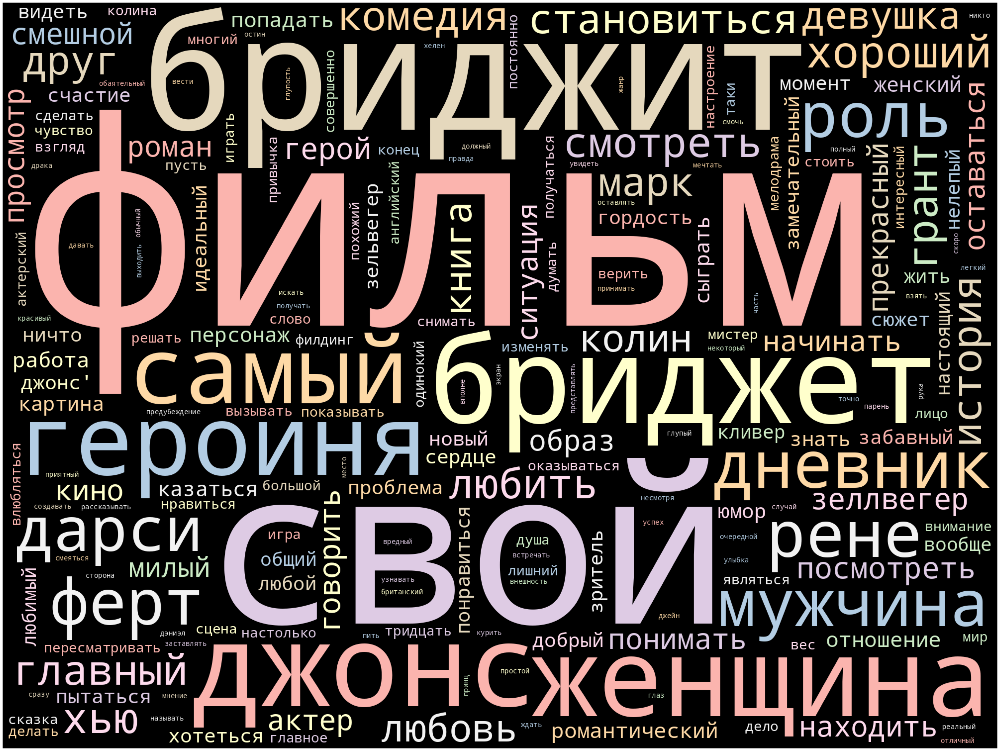

In [112]:
# Генерируем облако слов
wordcloud = WordCloud(width = 2000,
                      height = 1500,
                      random_state=1,
                      background_color='black',
                      margin=20,
                      colormap='Pastel1',
                      collocations=False,
                      stopwords = STOPWORDS_RU).generate(lem13)

# Рисуем картинку
plot_cloud(wordcloud)

In [113]:
wordcloud.to_file('bridget_kinopoisk1.png')

# Токенизация и частотность

In [114]:
#https://habr.com/ru/articles/800595/
#https://habr.com/ru/articles/517410/

In [115]:
len(lem13)

289108

In [116]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')
tokens3 = tokenizer.tokenize(lem13)
print(tokens3)

['дневник', 'бриджет', 'джонс', 'я', 'впервые', 'посмотреть', 'в', 'далекий', '2002', 'быть', 'я', 'тогда', '17', 'год', 'помнить', 'фильм', 'показываться', 'я', 'замечательный', 'романтический', 'сказка', 'в', 'основное', 'благодаря', 'персонаж', 'колин', 'ферт', 'марка', 'дарси', 'в', 'который', 'я', 'как', 'и', 'полагаться', 'влюбляться', 'пересматривать', 'фильм', 'недавно', 'за', 'компания', 'с', 'подруга', 'я', 'оценивать', 'он', 'более', 'взрослый', 'взгляд', 'хотя', 'некоторый', 'впечатление', 'почти', 'не', 'изменяться', 'это', 'в', 'основной', 'касаться', 'главный', 'герой', 'а', 'вот', 'история', 'до', 'это', 'оставлять', 'почти', 'равнодушный', 'теперь', 'скоро', 'приводить', 'в', 'недоумение', 'я', 'не', 'понимать', 'за', 'что', 'все', 'так', 'любить', 'бриджет', 'джонс', 'не', 'понимать', 'она', 'феномен', 'ах', 'да', 'она', 'ведь', 'такой', 'несовершенный', 'прямо', 'как', 'весь', 'мы', 'да', 'никто', 'из', 'мы', 'не', 'совершенный', 'но', 'это', 'не', 'оправдывать', 'от

In [117]:
len(tokens3)

44304

Убираем лишние слова:

In [118]:
from nltk.corpus import stopwords
#STOPWORDS_RU = get_stop_words('russian')
#russian_stopwords = set(stopwords.words('russian'))

clean_tkns3 = [w for w in tokens3 if w not in STOPWORDS_RU]
print(clean_tkns3)

['дневник', 'бриджет', 'джонс', 'впервые', 'посмотреть', 'далекий', '2002', '17', 'помнить', 'фильм', 'показываться', 'замечательный', 'романтический', 'сказка', 'основное', 'благодаря', 'персонаж', 'колин', 'ферт', 'марка', 'дарси', 'полагаться', 'влюбляться', 'пересматривать', 'фильм', 'компания', 'подруга', 'оценивать', 'взрослый', 'взгляд', 'некоторый', 'впечатление', 'изменяться', 'основной', 'касаться', 'главный', 'герой', 'история', 'оставлять', 'равнодушный', 'скоро', 'приводить', 'недоумение', 'понимать', 'любить', 'бриджет', 'джонс', 'понимать', 'феномен', 'ах', 'несовершенный', 'прямо', 'никто', 'совершенный', 'оправдывать', 'откровенно', 'глупый', 'поведение', 'бриджет', 'некоторый', 'сцена', 'спорить', 'казус', 'случаться', 'зависеть', 'умственный', 'способность', 'постоянно', 'нести', 'всякий', 'вздор', 'милый', 'непосредственный', 'выражение', 'индивидуальность', 'натуральный', 'проявление', 'глупость', 'понятный', 'дело', 'комедия', 'главный', 'героиня', 'должный', 'сме

In [119]:
#Для подсчёта статистики распределения частот слов в тексте применяется класс FreqDist (frequency distributions):

from nltk.probability import FreqDist
#fdist = FreqDist(clean_tkns3)

In [125]:
FreqDist(clean_tkns3).most_common(30)

[('фильм', 551),
 ('свой', 294),
 ('джонс', 259),
 ('бриджит', 256),
 ('бриджет', 246),
 ('женщина', 196),
 ('10', 168),
 ('героиня', 155),
 ('дневник', 141),
 ('самый', 139),
 ('мужчина', 133),
 ('рене', 131),
 ('ферт', 126),
 ('роль', 123),
 ('дарси', 122),
 ('хороший', 110),
 ('грант', 101),
 ('хью', 100),
 ('главный', 97),
 ('любить', 94),
 ('смотреть', 93),
 ('история', 91),
 ('становиться', 91),
 ('комедия', 90),
 ('друг', 85),
 ('марк', 84),
 ('любовь', 82),
 ('книга', 78),
 ('колин', 76),
 ('девушка', 76)]

<Axes: xlabel='Samples', ylabel='Counts'>

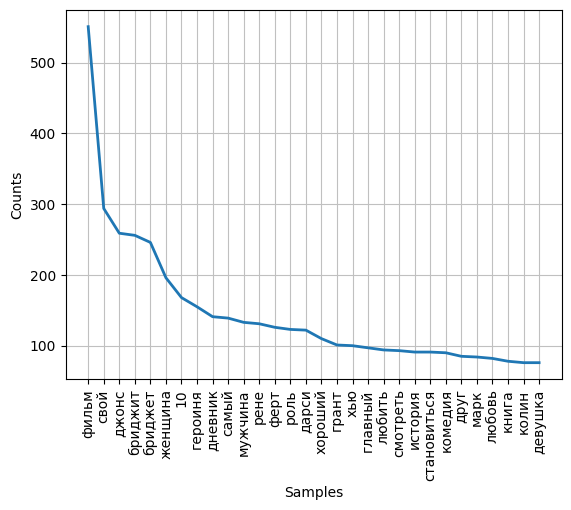

In [121]:
FreqDist(clean_tkns3).plot(30,cumulative=False)

In [122]:
#Вы можете добавить свои стоп-слова в переменнуюSTOPWORDS_RU с помощью метода .add (‘новое стоп-слово’)
#print(STOPWORDS_RU)
#STOPWORDS_RU.add('свой')

Всё, с Кинопоиском закончили!

# **Шаг 4**: отзывы на сайте IMDb
Теперь попробуем спарсить киноотзывы с англоязычного сайта IMDb.

Начинаем так же, как и до этого с Кинопоиском.

In [ ]:
# инициализируем html-код страницы
url4 = 'https://www.imdb.com/title/tt0251127/reviews/?ref_=tt_ururv_sm&sort=submission_date%2Cdesc'
page = requests.get(url4)
print(page.status_code)

403


Вот и первое отличие сайтов. Этот гораздо хитрее, выдает нам ошибку 403.
Надо сделать так, чтобы статус был равен 200.

Приведенный ниже код случайным образом добавляет каждый пользовательский агент в заголовок, используя random.choice() метод:

In [ ]:
from bs4 import BeautifulSoup
import requests
import random

In [ ]:
# Create a list of user agents
user_agents =[
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:124.0) Gecko/20100101 Firefox/124.0',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 Edg/123.0.2420.81',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 OPR/109.0.0.0',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14.4; rv:124.0) Gecko/20100101 Firefox/124.0',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14_4_1) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.4.1 Safari/605.1.15',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 14_4_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 OPR/109.0.0.0',
    'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36',
    'Mozilla/5.0 (X11; Linux i686; rv:124.0) Gecko/20100101 Firefox/124.0'
    ]

target_website = 'https://www.imdb.com/title/tt0251127/reviews/?ref_=tt_ururv_sm&sort=submission_date%2Cdesc'

# Add user agents at random
request_headers = {
    'user-agent': random.choice(user_agents)
}

# Initiate HTTP request
response = requests.get(target_website, headers=request_headers)

# Resolve HTTP response
if response.status_code == 200:
    # View request user agent
    print(f'User agent used: {response.request.headers["user-agent"]}')
    print(response.status_code)
else:
    print(response)

User agent used: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36
200


Ура, победа, ура!
Всё, теперь действуем по старой схеме:

In [ ]:
soup_imdb = BeautifulSoup(response.text, "html.parser")
print(soup_imdb) #Нам вылезет весь html-код нашей страницы

<!DOCTYPE html>
<html lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><script>window.addEventListener('load', (event) => {
        if (typeof window.csa !== 'undefined' && typeof window.csa === 'function') {
            var csaLatencyPlugin = window.csa('Content', {
                element: {
                    slotId: 'LoadTitle',
                    type: 'service-call'
                }
            });
            csaLatencyPlugin('mark', 'clickToBodyBegin', 1741333881670);
        }
    })</script><title>How to Lose a Guy in 10 Days (2003) - User reviews - IMDb</title><meta content="How to Lose a Guy in 10 Days (2003) - Movies, TV, Celebs, and more..." data-id="main" name="description"/><meta content="Reviews, Showtimes, DVDs, Photos, Message Boards, User Ratings,

In [ ]:
#Теперь создадим два списка для текстов
filteredText4 = []
allText4 = []

allText4 = soup_imdb.findAll('div', class_='ipc-html-content-inner-div', role='presentation')

for data in allText4:
    if data.findAll('div', class_='ipc-html-content-inner-div', role='presentation') is not None:
        filteredText4.append(data.text)

for data in filteredText4:
    print(data)

Made me wanna die at bits. Absolutely loved it. How to Lose a Guy in 10 Days- I'll admit, it's a rare occurrence for me to enjoy a romance-centric film, but this one actually grabbed me. There's something about it that elevates the genre beyond the typical "will they, won't they" nonsense. It doesn't just rely on chemistry or predictable tropes to carry the plot, it has genuine substance. And while I didn't really care about whether they got together in the end, it was the journey of *how* they got there that made this movie a surprisingly solid watch.The premise itself is a stroke of brilliance: she's trying to lose him, he's trying to get her. It sets up this back-and-forth tension that, for once, feels like it's got a little more going on. I mean, it's not just about the romance, it's the games they're playing with each other. At first, I was skeptical about how much weight it could give to the idea of trying to actively sabotage a relationship. But it managed to keep me engaged mai

<ipython-input-7-300924a625f4>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allText4 = soup_imdb.findAll('div', class_='ipc-html-content-inner-div', role='presentation')
<ipython-input-7-300924a625f4>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if data.findAll('div', class_='ipc-html-content-inner-div', role='presentation') is not None:


In [ ]:
print(filteredText4[0])

Made me wanna die at bits. Absolutely loved it. How to Lose a Guy in 10 Days- I'll admit, it's a rare occurrence for me to enjoy a romance-centric film, but this one actually grabbed me. There's something about it that elevates the genre beyond the typical "will they, won't they" nonsense. It doesn't just rely on chemistry or predictable tropes to carry the plot, it has genuine substance. And while I didn't really care about whether they got together in the end, it was the journey of *how* they got there that made this movie a surprisingly solid watch.The premise itself is a stroke of brilliance: she's trying to lose him, he's trying to get her. It sets up this back-and-forth tension that, for once, feels like it's got a little more going on. I mean, it's not just about the romance, it's the games they're playing with each other. At first, I was skeptical about how much weight it could give to the idea of trying to actively sabotage a relationship. But it managed to keep me engaged mai

In [ ]:
#Даты
allCalendar4 = []
filteredCalendar4 = []

allCalendar4 = soup_imdb.findAll('li', role='presentation', class_='ipc-inline-list__item review-date')

for dataCalendar in allCalendar4:
    if dataCalendar.findAll('li', role='presentation', class_='ipc-inline-list__item review-date') is not None:
        filteredCalendar4.append(dataCalendar.text)

<ipython-input-9-d80c2476caa1>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allCalendar4 = soup_imdb.findAll('li', role='presentation', class_='ipc-inline-list__item review-date')
<ipython-input-9-d80c2476caa1>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataCalendar.findAll('li', role='presentation', class_='ipc-inline-list__item review-date') is not None:


In [ ]:
print(filteredCalendar4[0])

Feb 28, 2025


In [ ]:
#Заголовки
allTitle4 = []
filteredTitle4 = []

allTitle4 = soup_imdb.findAll('h3', class_='ipc-title__text')

for dataTitle in allTitle4:
    if dataTitle.findAll('h3', class_='ipc-title__text') is not None:
        filteredTitle4.append(dataTitle.text)

<ipython-input-11-3c1dd532c1c1>:5: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  allTitle4 = soup_imdb.findAll('h3', class_='ipc-title__text')
<ipython-input-11-3c1dd532c1c1>:8: DeprecationWarning: Call to deprecated method findAll. (Replaced by find_all) -- Deprecated since version 4.0.0.
  if dataTitle.findAll('h3', class_='ipc-title__text') is not None:


In [ ]:
print(filteredTitle4[0])

7.9/10


In [ ]:
print(len(filteredText4))
print(len(filteredTitle4))
print(len(filteredCalendar4))

22
28
25


Образовалась новая проблема.

Во-первых, количество элементов в списках разное.
Во-вторых, парсятся только первые 20-30 киноотзывов, чтобы раскрыть все, нужно нажать на кнопку.

In [ ]:
print(filteredTitle4[0:])

['7.9/10', 'Get rid of a guy in 10 days', 'Ups', 'Back when romcoms were legally permitted cocaine', 'Oh to stuck in real life 2000s rom-com !!', 'A SWEET-ASTTRINGENT ROMACE FILM', 'Another average and mediocre RomCom...', 'A classic romcom', 'Fun feel good movie', 'A Beautiful Throwback to the 90s', 'Review: "How to Lose a Guy in 10 Days"', '"Simple storyline executed Brilliantly"', 'Good but forgettable in 10 days', 'MUST watch ROMCOM', 'Frost yourselves ladies (or something like that)', "A Masterclass in Dating 'Don'ts'", 'Ohh I Just Loved This One.', 'one of the best romcoms i watched', 'Good film', 'Sweet movie!!', 'An enjoyable, entertaining romantic comedy', 'Cute formula romantic situation.', "Looking for a rom-com that's both hilarious and heartwarming?", 'One of them is lying. So is the other.', 'Highly recommend this one!', 'More from this title', 'More to explore', 'Recently viewed']


Придется все-таки разбираться с selenium

# Разбираемся с selenium
**BN! Не запускается на Google Colab! Запускать только на Jupyter!!!**

***Обновление:** кто-то пытался на колабе и, вроде, успешно. Проверить!*

In [ ]:
import time
!pip install selenium
from time import sleep
from selenium import webdriver

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 67.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 24.2 MB/s eta 0:00:00


In [ ]:
#Импорт опций Chrome
from selenium.webdriver.chrome.options import Options

In [ ]:
option = webdriver.ChromeOptions()
driver = webdriver.Chrome()

driver.get('https://www.imdb.com/title/tt0251127/reviews/?ref_=tt_ururv_sm&sort=submission_date%2Cdesc')

SessionNotCreatedException: Message: session not created: probably user data directory is already in use, please specify a unique value for --user-data-dir argument, or don't use --user-data-dir
Stacktrace:
#0 0x561dad14346a <unknown>
#1 0x561dacbfced0 <unknown>
#2 0x561dacc36c8f <unknown>
#3 0x561dacc3268f <unknown>
#4 0x561dacc831cf <unknown>
#5 0x561dacc82706 <unknown>
#6 0x561dacc74633 <unknown>
#7 0x561dacc401be <unknown>
#8 0x561dacc41981 <unknown>
#9 0x561dad10986b <unknown>
#10 0x561dad10d73c <unknown>
#11 0x561dad0f0f12 <unknown>
#12 0x561dad10e2b4 <unknown>
#13 0x561dad0d50af <unknown>
#14 0x561dad131ad8 <unknown>
#15 0x561dad131cb6 <unknown>
#16 0x561dad1422e6 <unknown>
#17 0x7d7c0c10dac3 <unknown>


# **СКРЫТЬ**

In [ ]:
#dict4 = {'calendar': filteredCalendar4, 'title': filteredTitle4, 'text': filteredText4}

#df4 = pd.DataFrame(dict4)

#print(df4)

In [ ]:
#df4.to_csv('10dney_imdb.csv', index=False)